## *instats* Workshop, November 18-22, 2024 
### https://instats.org/seminar/computational-network-science-using-pyth2

# COMPUTATIONAL NETWORK SCIENCE USING PYTHON
## Moses Boudourides

# II. EXAMPLES OF LARGE GRAPHS AND KNOWLEDGE GRAPHS

<span style="color:green">
    
### [1. American Football Games](#1)

### [2. LastFM Asia Friends](#2)

### [3. Airlines Flying among USA Airports](#3)
    
### [4. C. Elegans Neural Network](#4)

### [5. Dolphins](#5)

### [6. Collaborations on netscience](#6)

### [7. Jazz Musicians](#7)

### [8. Les Miserables](#8)
    
### [9. The Matrix Knowledge Graph](#9)
    
### [10. Knowledge Graph of Concepts](#10)
    
### [11. Knowledge Graph of Ukrainian Films](#11)
</span>

In [1]:
import pickle, logging, re, requests, urllib.request, io, zipfile, random, math, numpy as np, matplotlib.pyplot as plt, pycountry, pandas as pd
from collections import Counter
from io import StringIO
import networkx as nx

import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout
from networkx.drawing.nx_agraph import to_agraph

from bokeh.sampledata.airport_routes import routes, airports # pip install bokeh_sampledata
import holoviews as hv

import rdflib
from rdflib import Graph, Literal, RDF, URIRef
from rdflib.extras.external_graph_libs import rdflib_to_networkx_digraph, rdflib_to_networkx_multidigraph

from IPython.display import IFrame, HTML, Image

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning) 
warnings.simplefilter('ignore')
warnings.filterwarnings("ignore", category=UserWarning, message=".*does not look like a valid URI.*")
warnings.filterwarnings("ignore", module="rdflib")
warnings.filterwarnings("ignore", category=UserWarning, module="rdflib")
logging.basicConfig(level=logging.ERROR)

In [2]:
def edge_type(G):
    if not nx.is_weighted(G):
        if len(list(G.edges(data=True))[0][2])>0:
            weight_key = list(list(G.edges(data=True))[0][2].keys())[0]
            weight_value = list(list(G.edges(data=True))[0][2].values())[0]
            try:
                float(weight_value)
                print(f"Weighted graph with weight attribute '{weight_key}'.")
            except ValueError:
                print(f"Labeled graph with label attribute '{weight_key}'.")
        else:
            print("This graph has no edge attributes.")
    else:
        weight_key = list(next(iter(G.edges(data=True)))[2].keys())[0]
        print(f"Weighted graph with weight attribute '{weight_key}'.")
        
def extract_svo(text):
    sentences = text.split('.')
    data = []

    for sentence in sentences:
        sentence = sentence.strip()
        # Regex for matching simple subject-verb-object
        match = re.match(r"([A-Za-z\s]+)\s+([A-Za-z]+)\s+([A-Za-z\s]+)", sentence)
        
        if match:
            subject, predicate, object_ = match.groups()
            # Filter out long subjects, predicates, and objects
            if len(subject) <= 30 and len(predicate) <= 30 and len(object_) <= 30:
                data.append((subject.strip(), predicate.strip(), object_.strip()))
    
    return data

<a id='1'></a>
## <span style="color:green">1. American Football Games</span>

In [3]:
# # American football games between NCAA Division I colleges during Fall 2000 (as compiled by M. Girvan and M. Newman)

# # M. Girvan and M. E. J. Newman, "Community structure in social and biological networks." Proc. Natl. Acad. Sci. USA 99(12), 7821-7826 (2002). 
# # https://doi.org/10.1073/pnas.122653799

# url = "http://www-personal.umich.edu/~mejn/netdata/football.zip"

# sock = urllib.request.urlopen(url)  # open URL
# s = io.BytesIO(sock.read())  # read into BytesIO "file"
# sock.close()

# zf = zipfile.ZipFile(s)  # zipfile object
# txt = zf.read("football.txt").decode()  # read info file
# gml = zf.read("football.gml").decode()  # read gml data
# # throw away bogus first line with # from mejn files
# gml = gml.split("\n")[1:]
# G = nx.parse_gml(gml)  # parse gml data

# for node in list(G.nodes(data=True)):
#     if 'value' in node[1]:  # node[1] contains the attributes
#         G.nodes[node[0]].pop('value')

# with open("AmericanFootballGraph.pickle", "wb") as f:
#     pickle.dump(G, f)
    
# print(type(G),len(G.nodes),len(G.edges))  # <class 'networkx.classes.graph.Graph'> 115 613

In [4]:
with open("AmericanFootballGraph.pickle", "rb") as f:
    G = pickle.load(f)
print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.graph.Graph'> 115 613
This graph has no edge attributes.


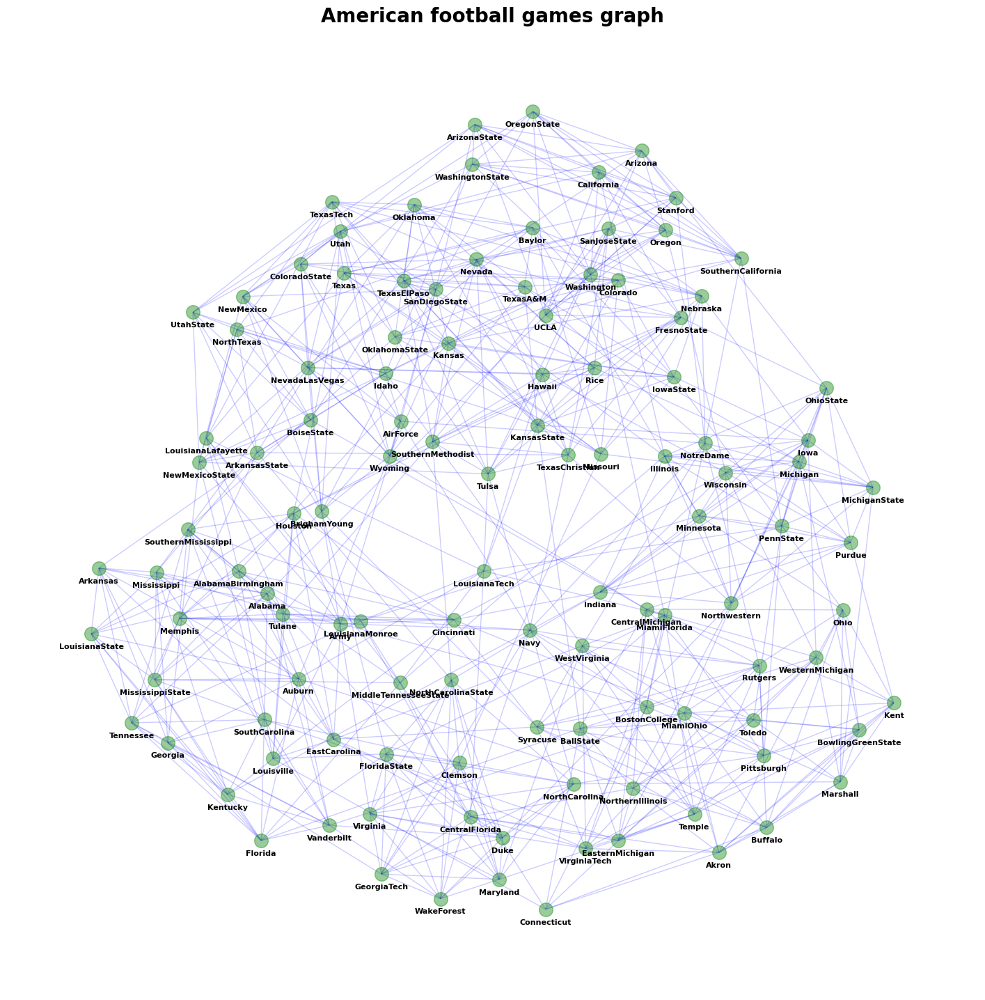

In [5]:
pos=graphviz_layout(G)
plt.figure(figsize=(18,18));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4, node_size=200)
nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.2)
offset = 4  
for node, (x, y) in pos.items():
    plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
plt.axis('off');
plt.title("American football games graph",fontsize=20, fontweight='bold');

<a id='2'></a>
## <span style="color:green">2. LastFM Asia Friends</span>

In [6]:
# # B. Rozemberczki and R. Sarkar, "Characteristic Functions on Graphs: Birds of a Feather, from Statistical Descriptors to Parametric Models," Proceedings of the 29th ACM International Conference on Information and Knowledge Management (CIKM '20), 1325–1334 (2020).
# # https://doi.org/10.1145/3340531.3411866

# url = "https://snap.stanford.edu/data/lastfm_asia.zip"
# response = requests.get(url)
# with zipfile.ZipFile(io.BytesIO(response.content)) as z:
#     edge_list_file = 'lasftm_asia/lastfm_asia_edges.csv'  
#     with z.open(edge_list_file) as f:
#         edges = pd.read_csv(f)
# G = nx.from_pandas_edgelist(edges, source='node_1', target='node_2')
# with open("LastFMAsiaSN.pickle", "wb") as f:
#     pickle.dump(G, f)
# print(type(G),len(G.nodes),len(G.edges)) <class 'networkx.classes.graph.Graph'> 7624 27806

In [7]:
with open("LastFMAsiaSN.pickle", "rb") as f:
    G = pickle.load(f)
print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.graph.Graph'> 7624 27806
This graph has no edge attributes.


In [8]:
# pos=graphviz_layout(G)
# plt.figure(figsize=(18,18));
# nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4, node_size=40)
# nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.3)
# # nx.draw_networkx_labels(G, pos)
# # offset = 4  
# # for node, (x, y) in pos.items():
# #     plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
# plt.axis('off');
# plt.title("LastFM Asia friendship graph",fontsize=20, fontweight='bold');

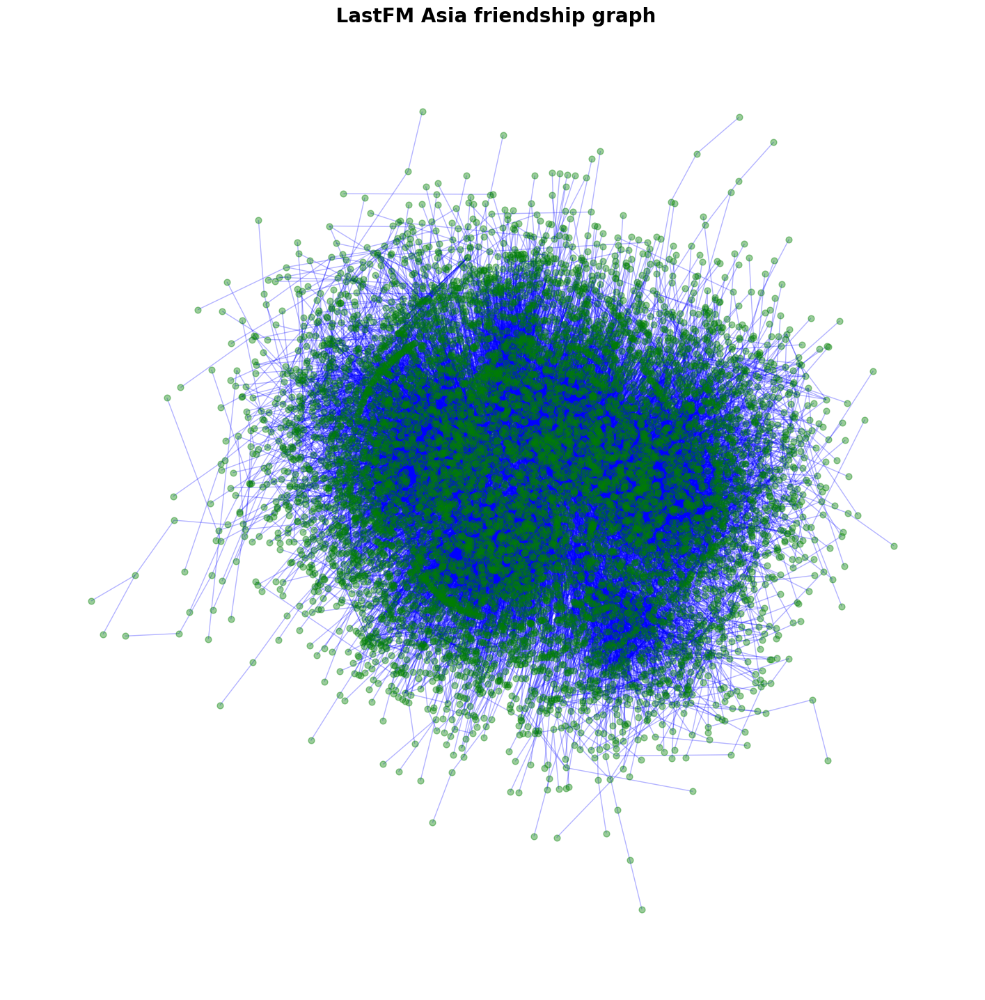

In [9]:
Image("LastFMAsiaSN.png", width=1000, height=1000)

### k-Cores

A **k-core** of a graph is a maximal subgraph in which every vertex has a degree of at least $k$. It is a concept useful for analyzing the structure of graphs by identifying cohesive subgroups or regions with a minimum level of connectivity.

Formal Definition:

Let $G = (V, E)$ be an undirected graph, where $V$ is the set of vertices, and $E$ is the set of edges. A **k-core** of $G$ is a subgraph $H = (V_H, E_H)$ of $G$ that satisfies the following conditions:

1. **Degree Constraint**: For each vertex $v \in V_H$, the degree of $v$ in $H$ is at least $k$. Formally, $\deg_H(v) \geq k$.
    
2. **Maximality**: $H$ is maximal with respect to the degree constraint, meaning that adding any other vertex from $V \setminus V_H$ to $H$ would violate the $k$-core condition. Therefore, $H$ is the largest possible subgraph satisfying the degree constraint.

Construction and Properties:

The $k$-core of a graph can be constructed through an iterative pruning process:

1. **Initialize**: Start with the entire graph $G$.
    
2. **Pruning**: Remove all vertices from $G$ with a degree less than $k$, along with their incident edges. This process may reduce the degrees of remaining vertices.
    
3. **Repeat**: Continue removing vertices that have degree less than $k$ after each pruning step until no such vertices are left.
    
4. **Result**: The remaining subgraph is the $k$-core of $G$.

If the entire graph is pruned away, then the $k$-core is empty.

Key Properties:

- **Uniqueness**: The $k$-core of a graph, if it exists, is unique. This means there is only one maximal subgraph for each $k$ satisfying the $k$-core property.
    
- **Nested Cores**: The $k$-cores of a graph form a nested hierarchy. If $H_k$ is the $k$-core and $H_{k+1}$ is the $(k+1)$-core, then $H_{k+1} \subseteq H_k$. This creates a *core decomposition* of the graph, where $k$-cores become progressively smaller as $k$ increases.
    
- **Degree Distribution**: Within a $k$-core, vertices may have degrees higher than $k$, but every vertex will have a degree of at least $k$.

In [10]:
k = 20  # Find the 20-core: every node has degree at least 20 
while True:
    core = nx.k_core(G, k)
    if core.number_of_nodes() <= 100:
        break
    k += 1  # Increase k for a denser subgraph
print(type(core),len(core.nodes),len(core.edges))

<class 'networkx.classes.graph.Graph'> 47 664


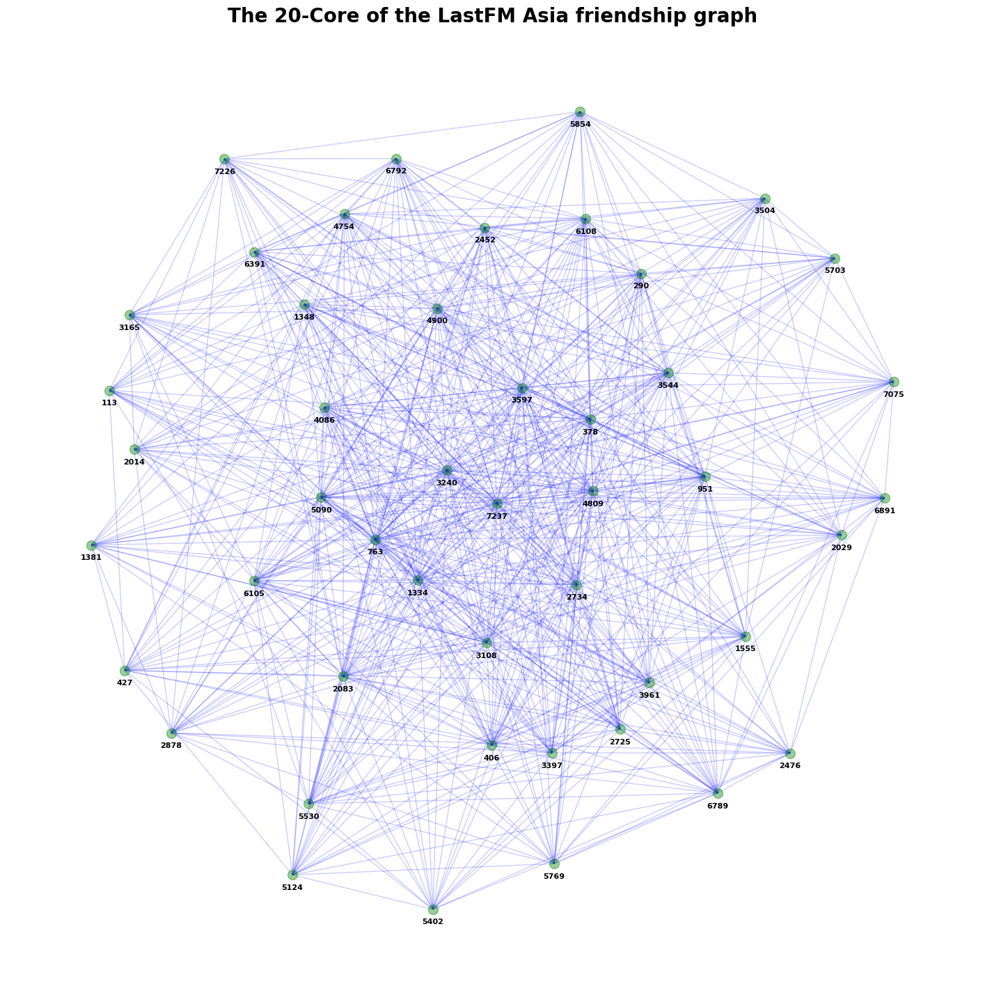

In [11]:
pos=graphviz_layout(core)
plt.figure(figsize=(18,18));
nodes = nx.draw_networkx_nodes(core, pos, node_color="g", alpha=0.4, node_size=100)
nx.draw_networkx_edges(core, pos,edge_color="b", alpha=0.2)
offset = 2  
for node, (x, y) in pos.items():
    plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
plt.axis('off');
plt.title("The 20-Core of the LastFM Asia friendship graph",fontsize=20, fontweight='bold');

<a id='3'></a>
## <span style="color:green">3. Airlines Flying among USA Airports</span>

In [12]:
# # routes=hv.Dataset(routes,'Airline',["Source","Destination"])
# # title="USA Flights"
# # routes_df = hv.Graph(routes, ['Source', "Destination"], 'Airline', label=title).data
# # routes_df=routes_df[["Airline","Source","Destination"]]
# # print(len(routes_df))
# routes_df.to_csv("routes_df.csv", index=False)
# routes_df = pd.read_csv("routes_df.csv")
# # print(len(routes_df))  # 10507

# acodes_df=pd.read_csv("aircodes2.csv")
# acodes_d=dict(zip(acodes_df.Code, acodes_df.Airline))
# acodes_i_d={v:k for k,v in acodes_d.items()}

# airports_df=pd.read_csv("airports2.csv")
# airports_d=dict(zip(airports_df.Code, airports_df.Name))
# airports_i_d={v:k for k,v in airports_d.items()}
# airports_i_d["Lansing Municipal Airport"]="LAN"
# airports_i_d["Tri Cities Airport"]="PSC"

# all_airlines=sorted(routes_df["Airline"].unique())
# # Group by pairs of (Source, Destination) and aggregate unique airlines
# airlines_per_route = routes_df.groupby(['Source', 'Destination'])['Airline'].unique().to_dict()
# airlines_per_route_str = {k:", ".join([str(x) for x in sorted(v)]) for k,v in airlines_per_route.items()}

# inv_airports_i_d={v:k for k,v in airports_i_d.items()}
# inv_acodes_i_d={v:k for k,v in acodes_i_d.items()}
# inv_airlines_per_route={}
# for k,v in airlines_per_route.items():
#     k0=inv_airports_i_d[k[0]]
#     k1=inv_airports_i_d[k[1]]
#     vv=[]
#     for w in v:
#         vv.append(inv_acodes_i_d[w])
#     w=sorted(w)
#     inv_airlines_per_route[(k0,k1)]=vv
    
# dedges=[]
# for i in range(len(routes_df)):
#     x=routes_df.iloc[i]["Source"]
#     y=routes_df.iloc[i]["Destination"]
#     z=routes_df.iloc[i]["Airline"]
#     dedges.append((airports_d[x],airports_d[y],airlines_per_route_str[(x,y)]))
# G=nx.DiGraph()
# for k in dedges:
#     G.add_edge(k[0],k[1],airline=k[2])
# with open("USAflightsGraph.pickle", "wb") as f:
#     pickle.dump(G, f)
# print(type(G),len(G.nodes),len(G.edges))  # <class 'networkx.classes.digraph.DiGraph'> 546 5439

In [13]:
with open("USAflightsGraph.pickle", "rb") as f:
    G = pickle.load(f)
print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.digraph.DiGraph'> 546 5439
Labeled graph with label attribute 'airline'.


In [14]:
# pos=graphviz_layout(G)
# plt.figure(figsize=(18,18));
# nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4, node_size=40)
# nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.3)
# # offset = 4  
# # for node, (x, y) in pos.items():
# #     plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
# plt.axis('off');
# plt.title("USA flights graph",fontsize=20, fontweight='bold');

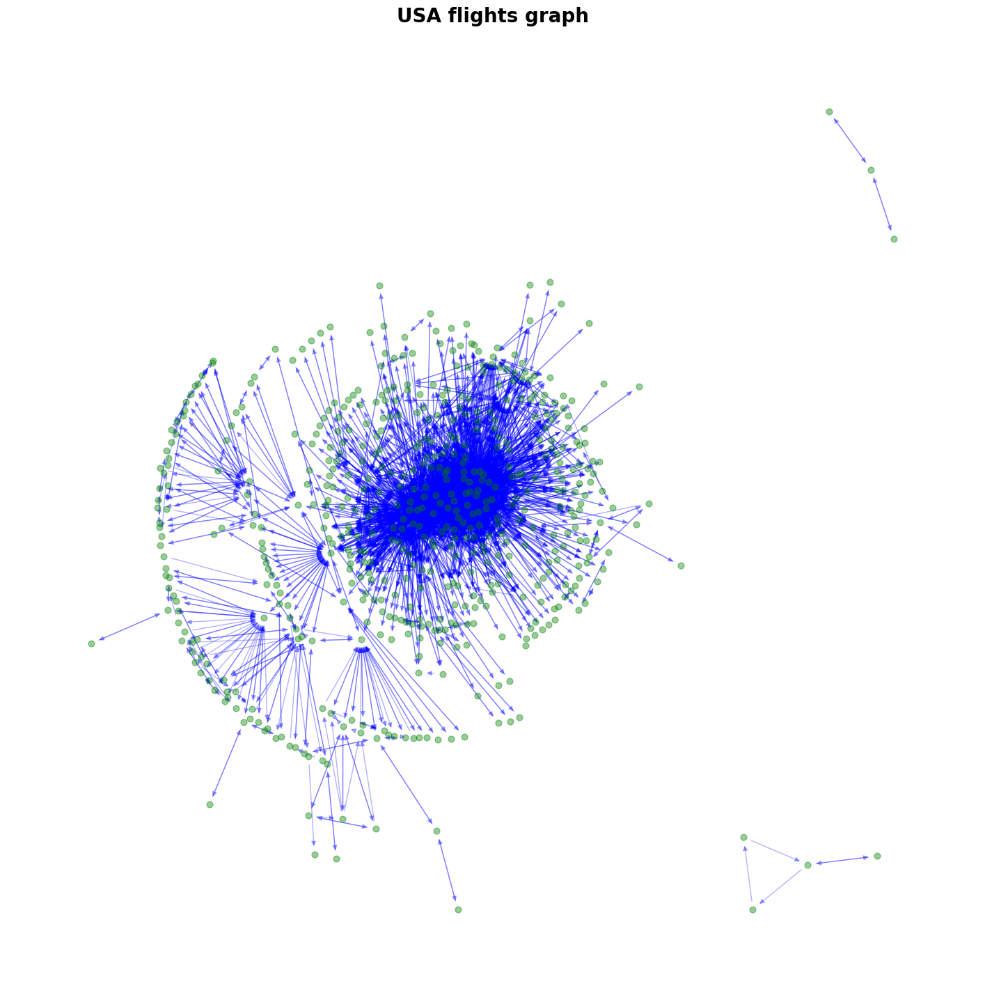

In [15]:
Image("USAflightsGraph.png", width=1000, height=1000)

In [16]:
k = 50  # Find the 50-core: every node has degree at least 50 
while True:
    core = nx.k_core(G, k)
    if core.number_of_nodes() <= 100:
        break
    k += 1  # Increase k for a denser subgraph
print(type(core),len(core.nodes),len(core.edges))

<class 'networkx.classes.digraph.DiGraph'> 43 1535


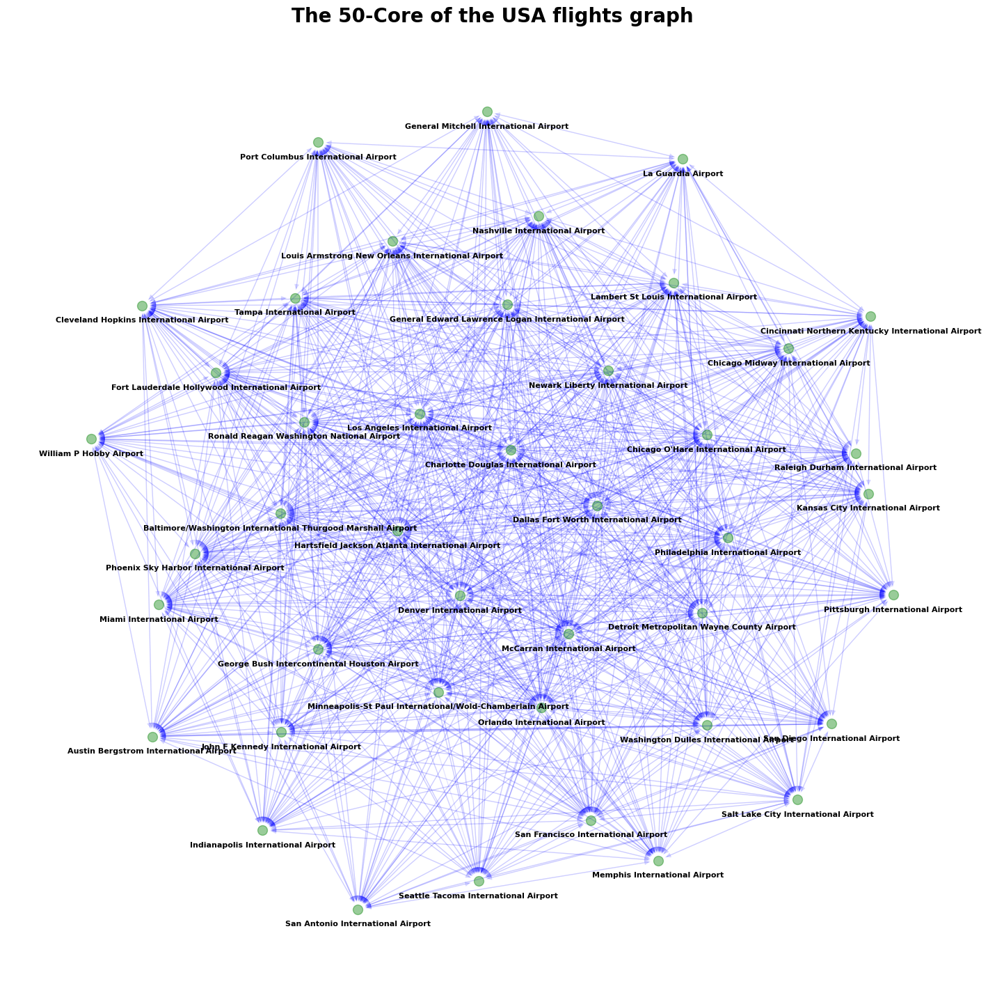

In [17]:
pos=graphviz_layout(core)
plt.figure(figsize=(18,18));
nodes = nx.draw_networkx_nodes(core, pos, node_color="g", alpha=0.4, node_size=100)
nx.draw_networkx_edges(core, pos,edge_color="b", alpha=0.1)
offset = 2  
for node, (x, y) in pos.items():
    plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
plt.axis('off');
plt.title("The 50-Core of the USA flights graph",fontsize=20, fontweight='bold');

<a id='4'></a>
## <span style="color:green">4. C. Elegans Neural Network</span>

In [18]:
# J. G. White, E. Southgate, J. N. Thompson, and S. Brenner, "The structure of the nervous system of the nematode Caenorhabditis elegans", Phil. Trans. R. Soc. London 314, 1-340 (1986) 
# https://doi.org/10.1098/rstb.1986.0056 

G=nx.read_graphml("celegansneural.GraphML")
for node in list(G.nodes(data=True)):
    if 'name' in node[1]:  # node[1] contains the attributes
        G.nodes[node[0]].pop('name')
print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.multidigraph.MultiDiGraph'> 297 2359
Weighted graph with weight attribute 'weight'.


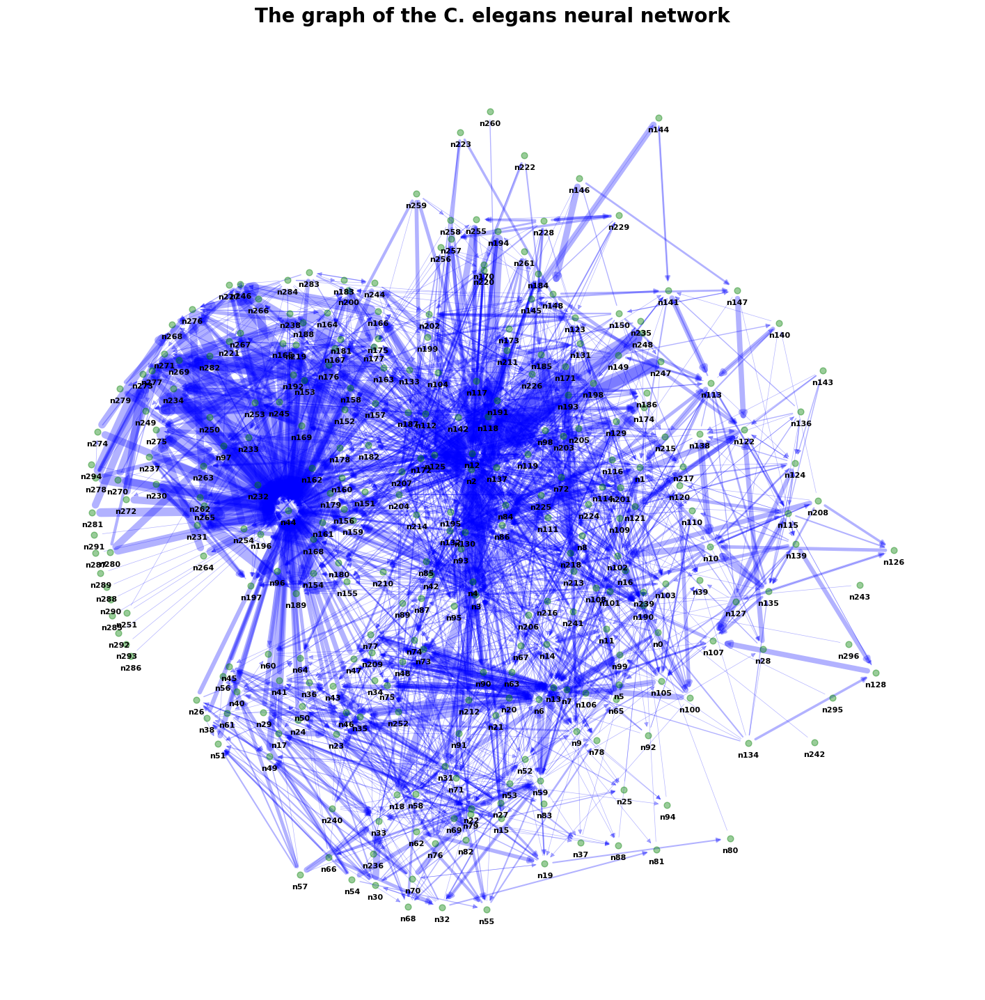

In [19]:
pos=graphviz_layout(G)
plt.figure(figsize=(18,18));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4, node_size=40)
edges = nx.draw_networkx_edges(G, pos,edge_color="b",alpha=0.3,width=[0.5*G[u][v][0]['weight'] for u, v in G.edges()])
offset = 4  
for node, (x, y) in pos.items():
    plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
plt.axis('off');
plt.title("The graph of the C. elegans neural network",fontsize=20, fontweight='bold');

<a id='5'></a>
## <span style="color:green">5. Dolphins</span>

In [20]:
# D. Lusseau, K. Schneider, O. J. Boisseau, P. Haase, E. Slooten, and S. M. Dawson, Behavioral Ecology and Sociobiology 54, 396-405 (2003)
# https://link.springer.com/article/10.1007/s00265-003-0651-y

G = nx.read_gml("dolphins.gml")
print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.graph.Graph'> 62 159
This graph has no edge attributes.


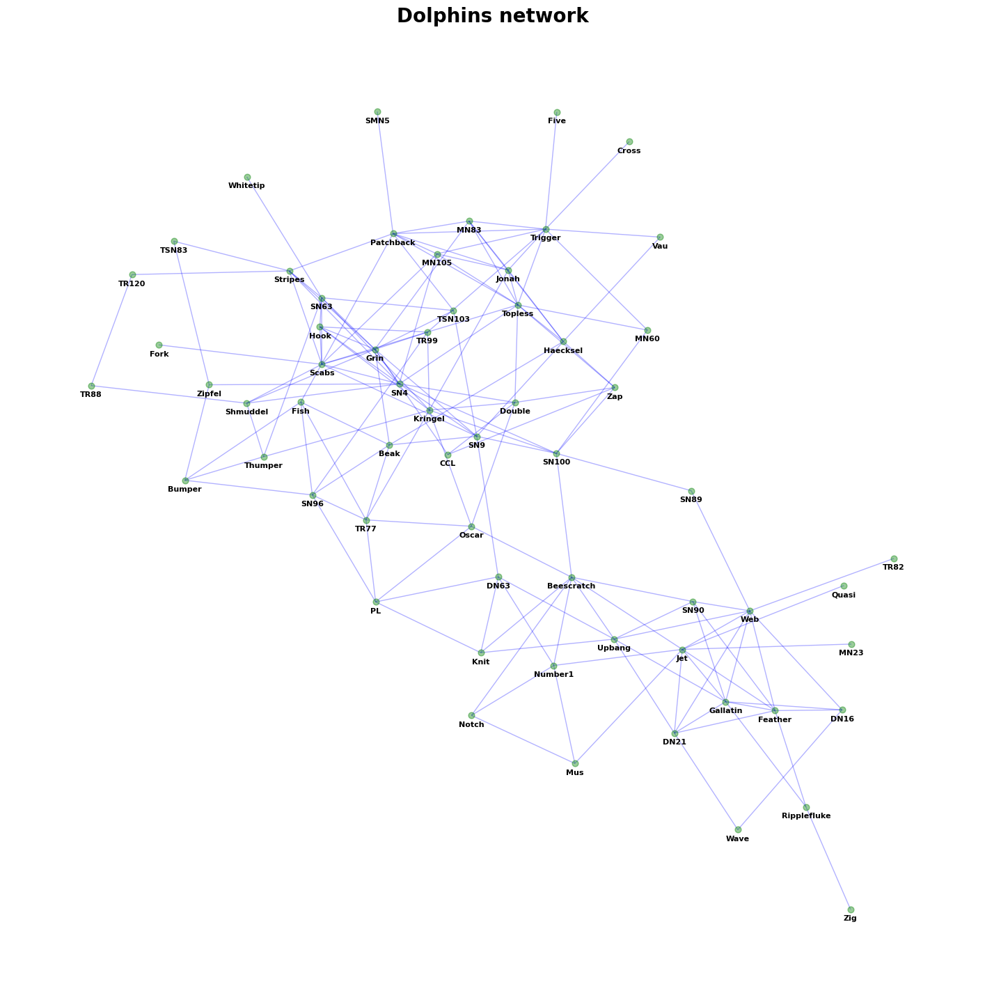

In [21]:
pos=graphviz_layout(G)
plt.figure(figsize=(18,18));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4, node_size=40)
nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.3)
offset = 4  
for node, (x, y) in pos.items():
    plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
plt.axis('off');
plt.title("Dolphins network",fontsize=20, fontweight='bold');

<a id='6'></a>
## <span style="color:green">6. Collaborations on netscience</span>

In [22]:
# M. E. J. Newman, "Finding community structure in networks using the eigenvectors of matrices." Phys. Rev. E 74, 036104 (2006)
# https://doi.org/10.1103/physreve.74.036104

G = nx.read_gml("netscience.gml")
print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.graph.Graph'> 1589 2742
Weighted graph with weight attribute 'value'.


In [23]:
k = 10  # Find the 10-core: every node has degree at least 10 
while True:
    core = nx.k_core(G, k)
    if core.number_of_nodes() <= 100:
        break
    k += 1  # Increase k for a denser subgraph
print(type(core),len(core.nodes),len(core.edges))

<class 'networkx.classes.graph.Graph'> 20 190


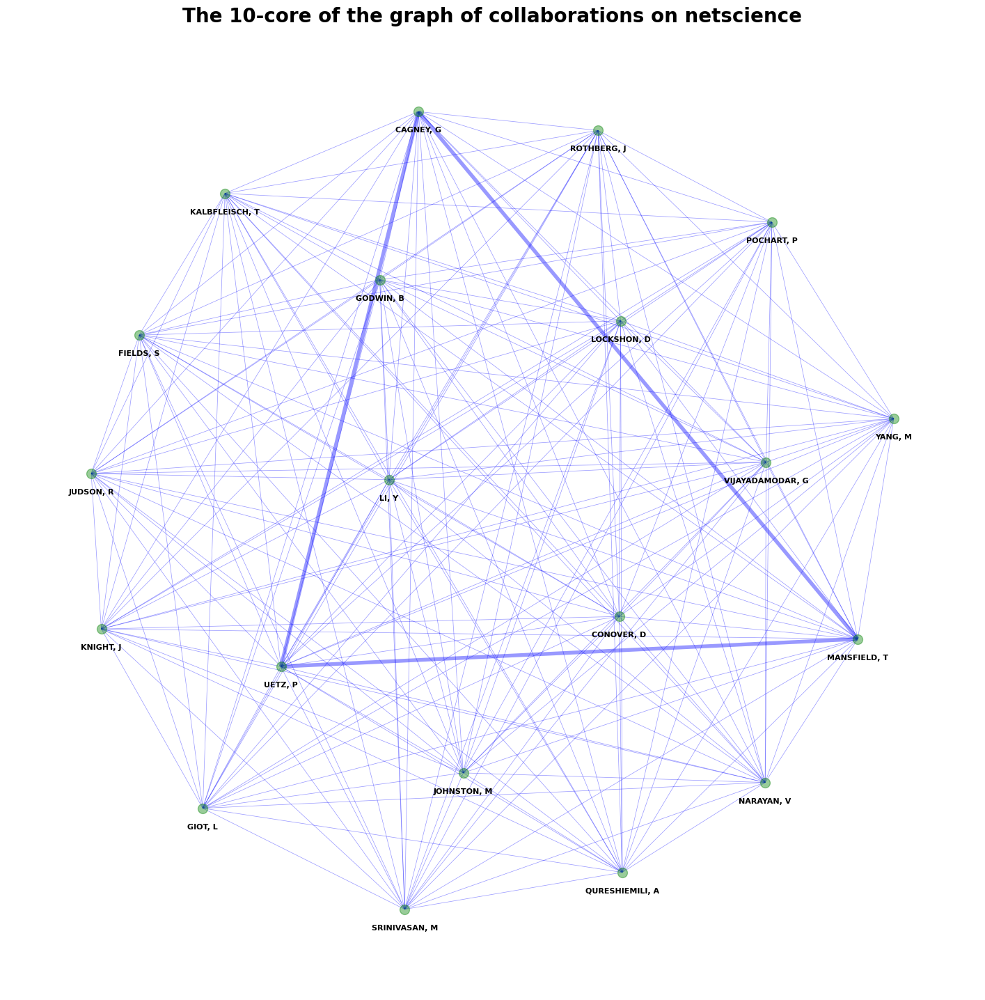

In [24]:
pos=graphviz_layout(core)
plt.figure(figsize=(18,18));
nodes = nx.draw_networkx_nodes(core, pos, node_color="g", alpha=0.4, node_size=100)
edges = nx.draw_networkx_edges(core, pos,edge_color="b",alpha=0.4,width=[10*core[u][v]['value'] for u, v in core.edges()])
offset = 2  
for node, (x, y) in pos.items():
    plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
plt.axis('off');
plt.title("The 10-core of the graph of collaborations on netscience",fontsize=20, fontweight='bold');

<a id='7'></a>
## <span style="color:green">7. Jazz Musicians</span>

In [25]:
# P. Gleiser and L. Danon, Community Structure in jazz, Adv. Complex Syst.6, 565 (2003)
# https://doi.org/10.1142/S0219525903001067 

eds=[]
with open("jazz.txt") as f:
    for line in f:
        line=line.strip()
        linel=line.split("  ")
        s=[]
        for l in linel:
            if len(l)>0:
                s.append(int(l.strip()))
        eds.append(tuple(s[0:2]))
G=nx.Graph()
G.add_edges_from(eds)
print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.graph.Graph'> 198 2742
This graph has no edge attributes.


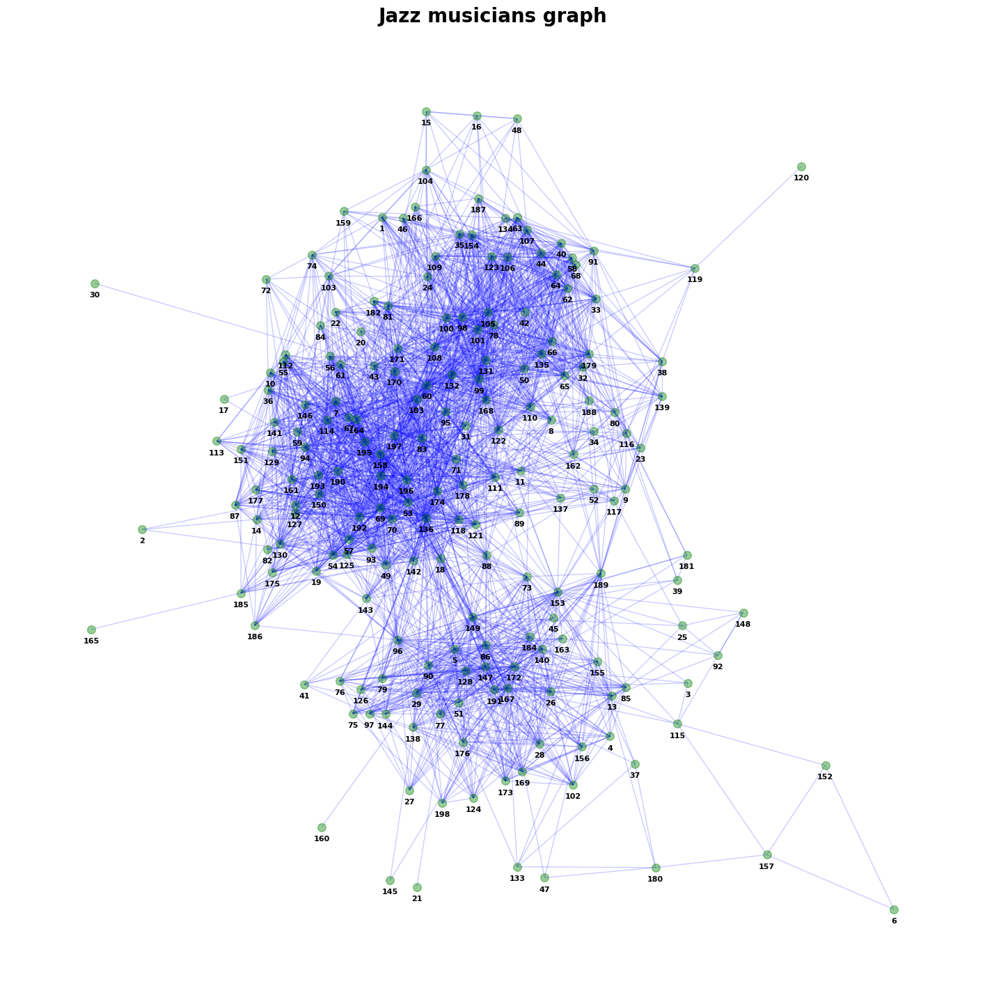

In [26]:
pos=graphviz_layout(G)
plt.figure(figsize=(18,18));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4, node_size=70)
nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.2)
offset = 4  
for node, (x, y) in pos.items():
    plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
plt.axis('off');
plt.title("Jazz musicians graph",fontsize=20, fontweight='bold');

<a id='8'></a>
## <span style="color:green">8. Les Miserables</span>

In [27]:
# https://networkx.org/documentation/stable/reference/generated/networkx.generators.social.les_miserables_graph.html
# D. E. Knuth, 1993. The Stanford GraphBase: a platform for combinatorial computing, pp. 74-87. New York: AcM Press.

G=nx.les_miserables_graph()
print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.graph.Graph'> 77 254
Weighted graph with weight attribute 'weight'.


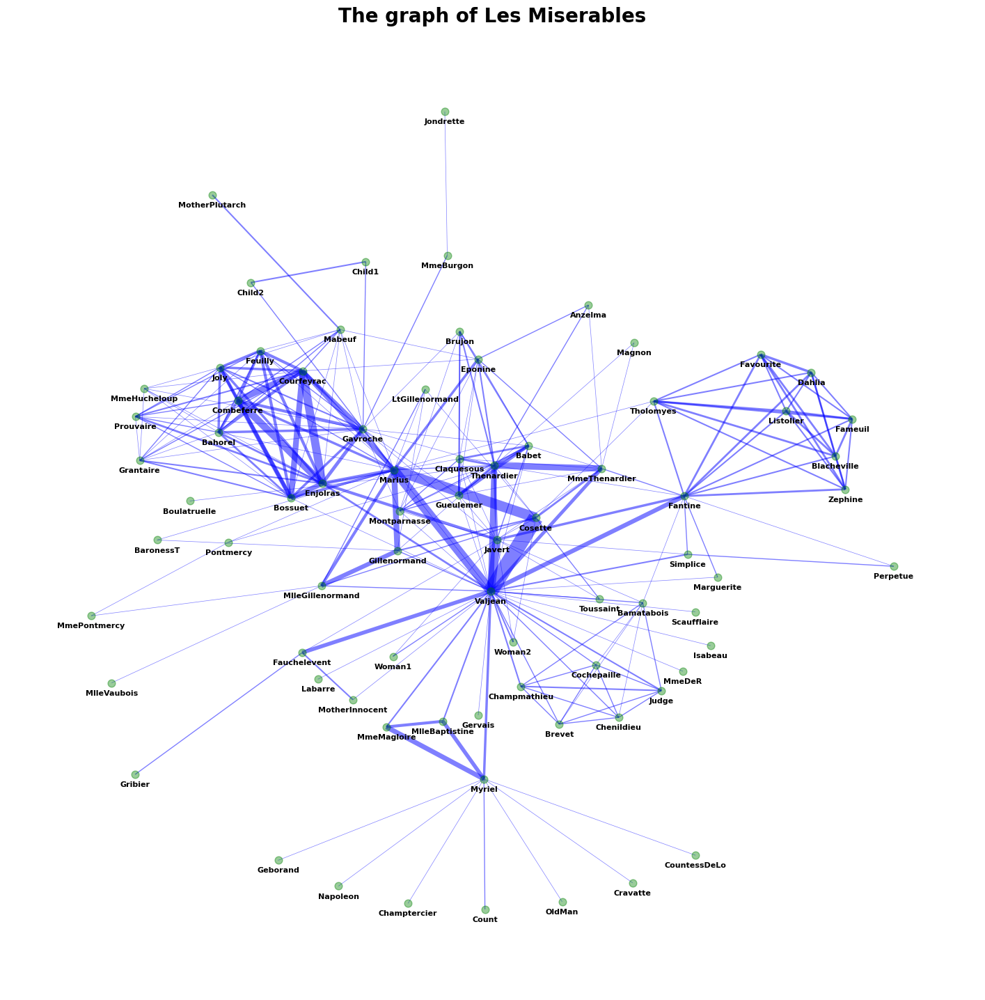

In [28]:
pos=graphviz_layout(G)
plt.figure(figsize=(18,18));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4, node_size=60)
edges = nx.draw_networkx_edges(G, pos,edge_color="b",alpha=0.5,width=[0.5*G[u][v]['weight'] for u, v in G.edges()])
offset = 4  
for node, (x, y) in pos.items():
    plt.text(x, y - offset, str(node), fontsize=8, ha='center', va='top', fontweight='bold')
plt.axis('off');
plt.title("The graph of Les Miserables",fontsize=20, fontweight='bold');

<a id='9'></a>
## <span style="color:green">9. The Matrix Knowledge Graph</span>

A **knowledge graph** is considered here as an **edge-labeled directed graph**, where:

- **{Nodes (Vertices)** represent entities or concepts in the domain of knowledge, such as \emph{"Person," "Organization," "Location"}, or specific instances like \emph{"Albert Einstein"} or \emph{"Berlin"}. <br>
<br>
- **Edges (Directed Arcs)** represent relationships between these entities. Each edge has:
    - A **direction** (from one node to another) to denote the source and target entities in a relationship. For instance, in "Albert Einstein" $\rightarrow$ "was born in" $\rightarrow$ "Ulm," the direction conveys that the birthplace pertains to Einstein, not vice versa.
    - An **edge label** that specifies the type of relationship or predicate connecting the entities. Common edge labels in a knowledge graph might be \emph{"is a member of," "works at," "has location,"} or \emph{"was born in"}.<br>
<br>
- **Edge Labels (Relationships)** are fundamental to a knowledge graph's structure, allowing the encoding of semantic relationships between entities. This labeling turns the graph into a richly structured database of - **Properties or Attributes** (optional) can be associated with both nodes and edges to provide additional information. For example, a node representing \emph{"Albert Einstein"} might have attributes like \emph{"date of birth"} or \emph{"field,"} while an edge labeled \emph{"published"} might include a timestamp.<br>
<br>
- Here nodes will be the **subject** and **object** and the edge will correspond to the **predicate** of a **sentence**.

In [29]:
# Dataset collected by querying ChatGPT to parsed the wikipedia page summary of The Matrix plot (https://en.wikipedia.org/wiki/The_Matrix)

df = pd.read_csv("TheMatrix_df.csv")
print(len(df))
df

37


,subject,predicate,object
0,police squad,corners,Trinity
1,Trinity,overpowers,police squad
2,Trinity,contacts,Neo
3,Trinity,tells,Neo
4,Trinity,has,answers
5,Trinity,seeks,Neo
6,they,fuse,his mouth
7,they,implant,a robotic bug
8,Neo,takes,the red pill
9,countless other pods,containing,other humans


In [30]:
# Create the knowledge graph of df

g = Graph()
for index, row in df.iterrows():
    subject = URIRef(row['subject'])
    predicate = URIRef(row['predicate'])
    obj = Literal(row['object'])
    g.add((subject, predicate, obj))

G = rdflib_to_networkx_digraph(g)
rnodes=G.nodes()
mapping = {n:str(n) for n in G.nodes()}  
G = nx.relabel_nodes(G, mapping)

labels={}
for e in G.edges(data=True):
    labels[(e[0],e[1])]=e[2]['triples'][0][1] 
labels={k:str(v) for k,v in labels.items()}

print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.digraph.DiGraph'> 38 35
Weighted graph with weight attribute 'triples'.


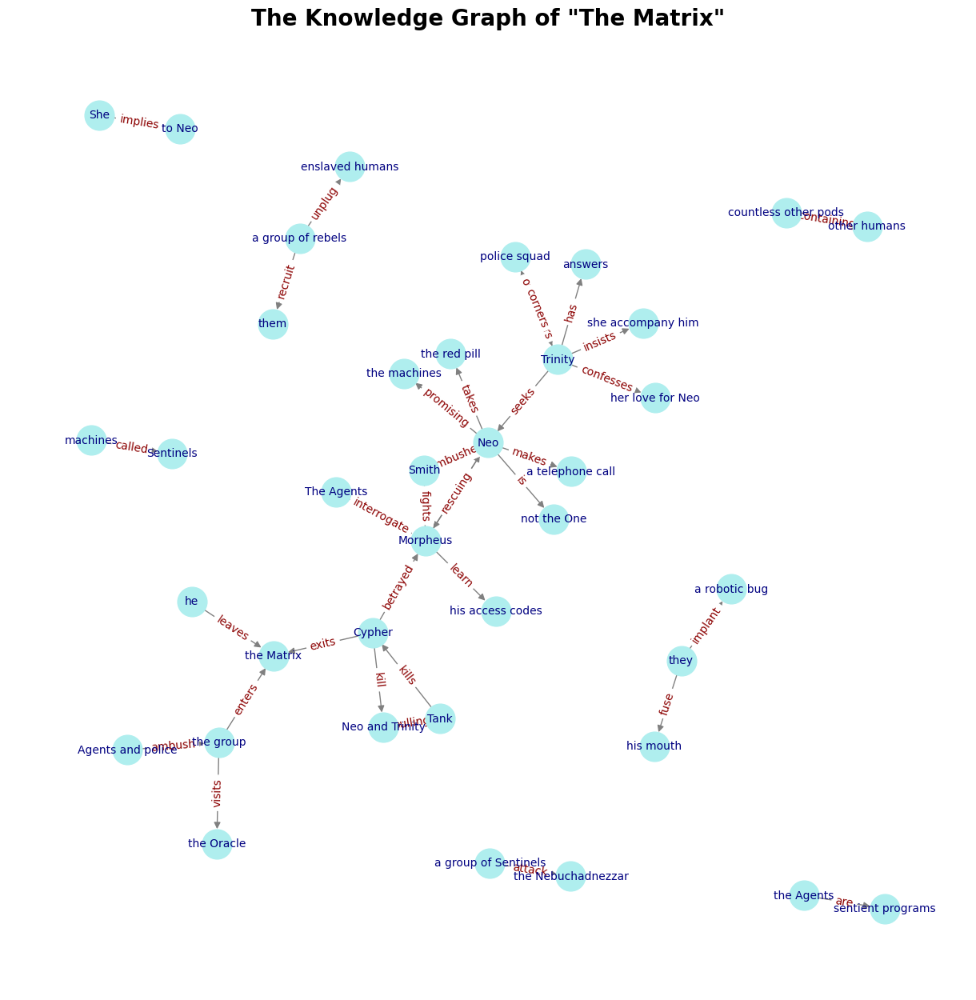

In [31]:
plt.figure(figsize=(12, 12))
pos = graphviz_layout(G) 
nx.draw(G, pos, with_labels=True, font_size=10, node_size=700, arrowsize=12, node_color='paleturquoise', edge_color='gray',font_color='navy') 
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=10,font_color='darkred') 
plt.title('The Knowledge Graph of "The Matrix"',fontsize=20,fontweight='bold')
plt.show()

<a id='10'></a>
## <span style="color:green">10. Knowledge Graph of Concepts</span>

In [52]:
# ConceptNet (https://conceptnet.io/) is a semantic network that focuses on relationships between real-world concepts.

# Here we are going to focus on Animals but one may try anyother type of concepts.

# Number of concepts
N = 5

# Type of concepts
concept = "animals"

# List of possible animal names to choose from
all_animals = ["dog", "cat", "elephant", "tiger", "lion", "giraffe", "whale", "shark", "bear", "rabbit", 
               "horse", "panda", "kangaroo", "zebra", "monkey", "wolf", "deer", "fox", "koala", "penguin"]

# Initialization
distinct_animals = set()
triples = []

# Function to remove articles from the beginning of the word
def remove_article_from_start(word):
    articles = ["a ", "an ", "the "]
    # Check if the word starts with an article and remove it
    for article in articles:
        if word.lower().startswith(article):
            return word[len(article):].strip()  # Remove the article at the start of the word
    return word  # Return the word as is if no article found

# Function to remove articles from the end of the word (for predicates)
def remove_article_from_end(word):
    articles = ["a", "an", "the"]
    # Check if the word ends with an article and remove it
    for article in articles:
        if word.lower().endswith(article):
            return word[:-len(article)].strip()  # Remove the article at the end of the word
    return word  # Return the word as is if no article found

# Loop until we have collected 5 distinct concepts
while len(distinct_animals) < 5:
    animal = random.choice(all_animals)  # Randomly pick an animal from the list
    if animal not in distinct_animals:
        distinct_animals.add(animal)  # Add to set to ensure uniqueness
        
        # Query ConceptNet for the selected animal
        url = f"https://api.conceptnet.io/query"
        params = {
            "start": f"/c/en/{animal}",  # Start node for the animal
            "limit": 5,  # Number of triples to return per animal
            "offset": 0  # Start from the first result
        }
        
        response = requests.get(url, params=params)
        data = response.json()

        # Extract the subject-predicate-object triples 
        for edge in data['edges']:
            subject = edge['start']['label']
            predicate = edge['rel']['label']
            object_ = edge['end']['label']
            
            # Exclude 'Synonym' predicates
            if predicate != 'Synonym':
                # Remove articles from subject, object, and predicate
                subject = remove_article_from_start(subject)
                object_ = remove_article_from_start(object_)
                predicate = remove_article_from_end(predicate)
                triples.append((subject, predicate, object_))

# Convert the list of triples to a pandas DataFrame
df = pd.DataFrame(triples, columns=["subject", "predicate", "object"])

# Display the DataFrame
df

,subject,predicate,object
0,horse,RelatedTo,animal
1,horse,Has,four legs
2,horse,RelatedTo,riding
3,horse,AtLocation,race track
4,horse,UsedFor,riding
5,whale,AtLocation,ocean
6,whale,Is,mammal
7,whale,Is,marine mammal
8,deer,Is,animal
9,deer,Is,ruminant


In [53]:
# Create the knowledge graph of df

g = Graph()
for index, row in df.iterrows():
    subject = URIRef(row['subject'])
    predicate = URIRef(row['predicate'])
    obj = Literal(row['object'])
    g.add((subject, predicate, obj))

G = rdflib_to_networkx_digraph(g)
rnodes=G.nodes()
mapping = {n:str(n) for n in G.nodes()}  
G = nx.relabel_nodes(G, mapping)

labels={}
for e in G.edges(data=True):
    labels[(e[0],e[1])]=e[2]['triples'][0][1] 
labels={k:str(v) for k,v in labels.items()}

print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.digraph.DiGraph'> 21 18
Weighted graph with weight attribute 'triples'.


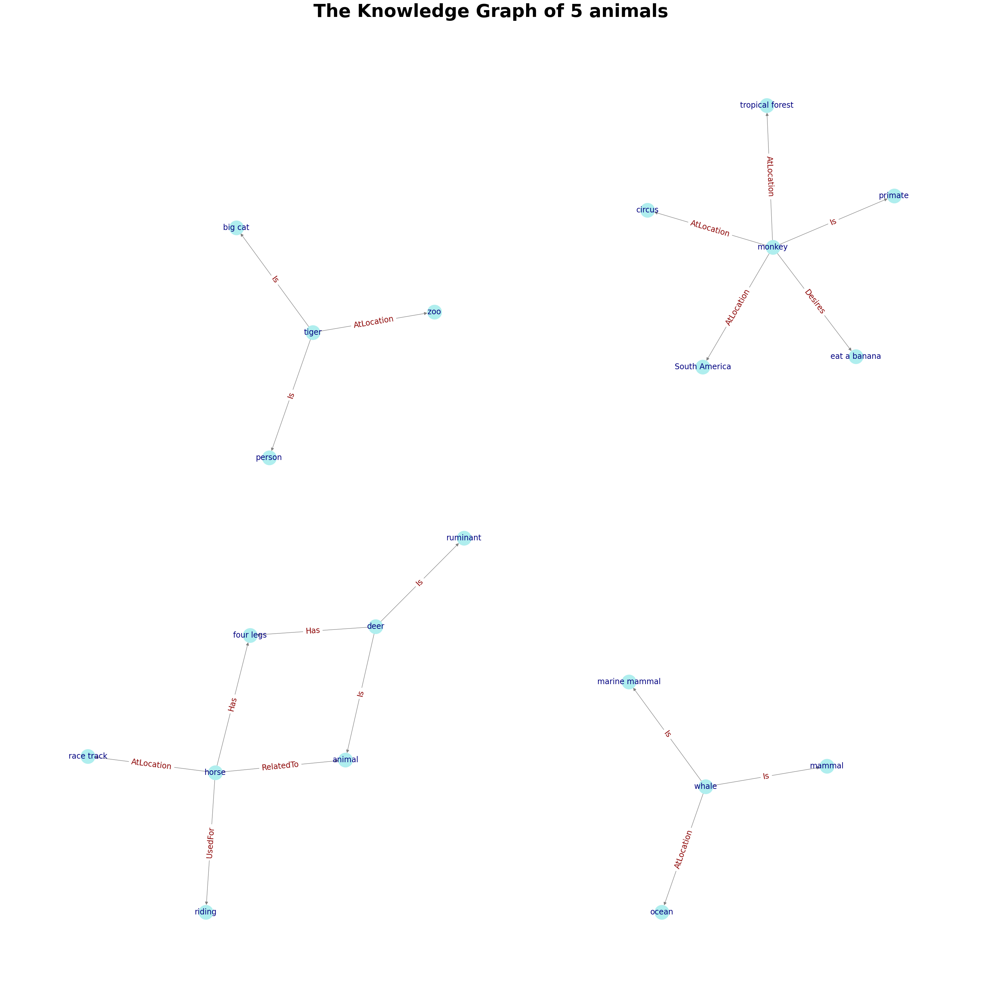

In [54]:
plt.figure(figsize=(30,30))
pos = graphviz_layout(G) 
nx.draw(G, pos, with_labels=True, font_size=17, node_size=1000, arrowsize=14, node_color='paleturquoise', edge_color='gray',font_color='navy') 
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=17,font_color='darkred') 
plt.title(f'The Knowledge Graph of {N} {concept}',fontsize=40,fontweight='bold')
plt.show()

<a id='11'></a>
## <span style="color:green">11. Knowledge Graph of Ukrainian Films</span>

In [35]:
# https://github.com/utkarshaditya01/IR---The-Entertainment-Knowledge-Graph

df=pd.read_csv("final_dataset_imdb.csv")
print(len(df))
df.head(3)

85845


,0,title,original_title,year,date_published,genre,duration,country,language,director,writer,production_company,actors,description,avg_vote,votes
0,1,Miss Jerry,Miss Jerry,1894,1894-10-09,Romance,45,USA,NaN,Alexander Black,Alexander Black,Alexander Black Photoplays,"Blanche Bayliss, William Courtenay, Chauncey D...",The adventures of a female reporter in the 1890s.,5.9,154
1,2,The Story of the Kelly Gang,The Story of the Kelly Gang,1906,1906-12-26,"Biography, Crime, Drama",70,Australia,NaN,Charles Tait,Charles Tait,J. and N. Tait,"Elizabeth Tait, John Tait, Norman Campbell, Be...",True story of notorious Australian outlaw Ned ...,6.1,589
2,3,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,"Urban Gad, Gebhard Schätzler-Perasini",Fotorama,"Asta Nielsen, Valdemar Psilander, Gunnar Helse...",Two men of high rank are both wooing the beaut...,5.8,188


In [36]:
ukraine_df=df[df["country"]=="Ukraine"]
ukraine_df.head(3)

,0,title,original_title,year,date_published,genre,duration,country,language,director,writer,production_company,actors,description,avg_vote,votes
26381,26387,Ameriken boy,Ameriken boy,1992,1992,"Action, Thriller",117,Ukraine,Russian,Boris Kvashnev,Yuriy Rogoza,Lybid,"Aleksandr Peskov, Vladimir Gostyukhin, Oleg Ro...",NaN,5.7,105
26549,26555,Holod 33,Holod 33,1991,1991,"Drama, History",115,Ukraine,Ukrainian,Oles Yanchuk,"Vasil Barka, Sergey Dyachenko",Fest Zemlya,"Galina Sulima, Georgiy Morozyuk, Aleksey Gorbu...",This film looks at the artificial famine of 19...,6.9,306
34768,34775,Fuchzhou,Fuchzhou,1993,1993,Drama,86,Ukraine,Ukrainian,Mykhailo Illienko,Mykhailo Illienko,NaN,"Taras Denisenko, Ivan Ilyenko, Nina Maslova, L...",A descendant of Ukrainians immigrants who once...,6.8,123


In [37]:
subject = []
predicate = []
objec = []
# year = []
for _, row in ukraine_df.iterrows():
    subject.append(row['director'])
    predicate.append('directed')
    objec.append(row['title'])
#     year.append(row['year'])
    subject.append(row['writer'])
    predicate.append('wrote')
    objec.append(row['title'])
#     year.append(row['year'])
df = pd.DataFrame({
    'subject': subject,
    'predicate': predicate,
    'object': objec #,
#     'year': year
})
df = df[~((df['subject'].str.contains(',', na=False)) & (df['object'].str.contains('|', na=False)))]
df = df[~df.applymap(lambda x: x == '').any(axis=1)]
print(len(df))
df

81


,subject,predicate,object
0,Boris Kvashnev,directed,Ameriken boy
1,Yuriy Rogoza,wrote,Ameriken boy
2,Oles Yanchuk,directed,Holod 33
4,Mykhailo Illienko,directed,Fuchzhou
5,Mykhailo Illienko,wrote,Fuchzhou
...,...,...,...
110,Vladyslav Klimchuk,directed,Skazhene vesillya
114,Oles Yanchuk,directed,Tayemnyy shchodennyk Symona Petlyury
116,Zaza Buadze,directed,Pozivniy «Banderas»
118,Olga Ryashina,directed,Seks i nichoho osobystoho


In [38]:
# Create the knowledge graph of df

g = Graph()
for index, row in df.iterrows():
    subject = URIRef(str(row['subject']) if pd.notna(row['subject']) else '')
    predicate = URIRef(str(row['predicate']) if pd.notna(row['predicate']) else '') # +" in "+str(row['year'])
    obj = Literal(str(row['object']) if pd.notna(row['object']) else '')
    g.add((subject, predicate, obj))

G = rdflib_to_networkx_digraph(g)
rnodes=G.nodes()
mapping = {n:str(n) for n in G.nodes()}  
G = nx.relabel_nodes(G, mapping)
G.remove_nodes_from([''])
G.remove_node("DZIDZIO First Time")

labels={}
for e in G.edges(data=True):
    labels[(e[0],e[1])]=e[2]['triples'][0][1] 
labels={k:str(v) for k,v in labels.items()}

print(type(G),len(G.nodes),len(G.edges))
edge_type(G)

<class 'networkx.classes.digraph.DiGraph'> 106 65
Weighted graph with weight attribute 'triples'.


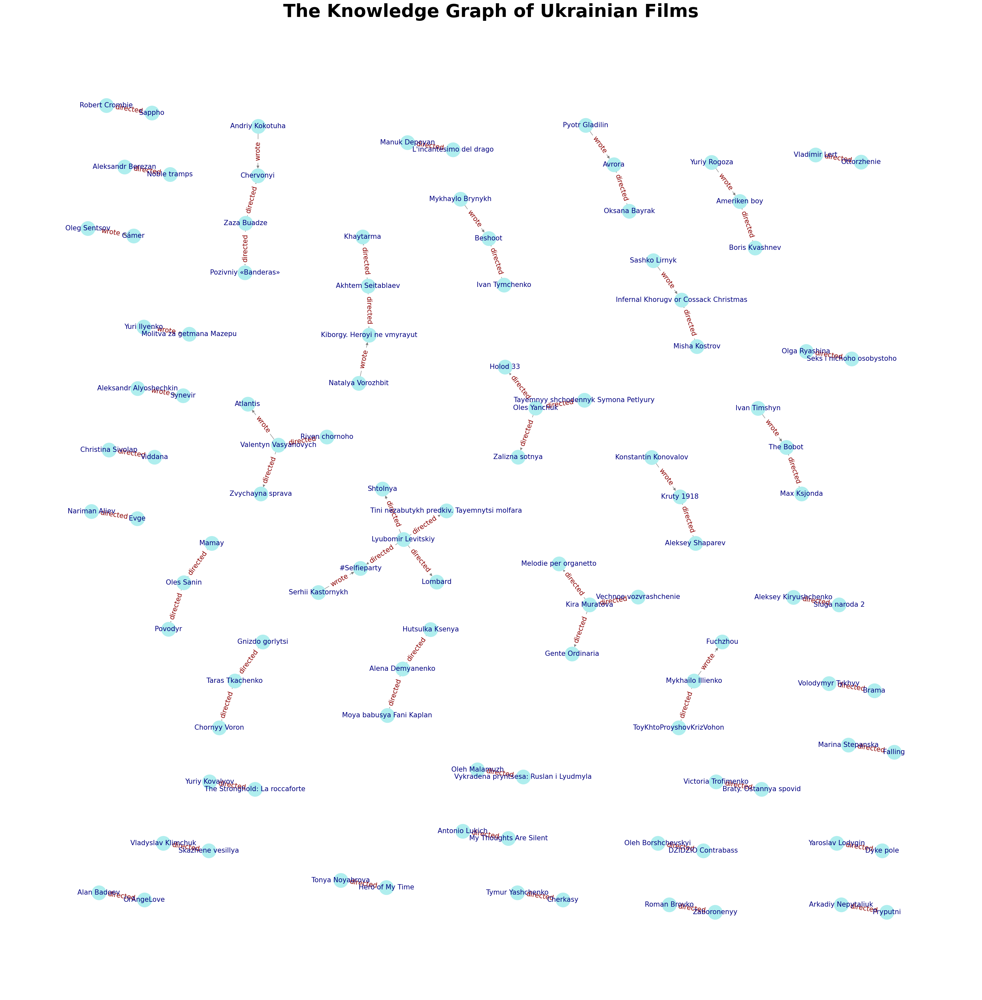

In [39]:
plt.figure(figsize=(30,30))
pos = graphviz_layout(G) 
nx.draw(G, pos, with_labels=True, font_size=15, node_size=1000, arrowsize=12, node_color='paleturquoise', edge_color='gray',font_color='navy') 
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=15,font_color='darkred') 
plt.title('The Knowledge Graph of Ukrainian Films',fontsize=40,fontweight='bold')
plt.show()